In [1]:
#Name: Domala Vamshikrishna
#Date:02-06-2022
#Model: polynomial regression
#station:51000
#Wave height Prediction

In [2]:
import csv
import numpy as np
#import folium
import pandas as pd
import math
from matplotlib import pyplot as plt

In [6]:
train = pd.read_excel("51000_Training.xlsx")

In [7]:
train

,Date,WDIR,WSPD,GST,WVHT,DPD,APD,MWD,PRES,ATMP,WTMP
0,2015-08-20 21:00:00,117,5.6,6.4,1.71,9.09,6.63,58,1015.7,26.4,26.6
1,2015-08-20 22:00:00,117,5.1,6.0,1.68,10.00,6.54,82,1015.5,26.3,26.7
2,2015-08-20 23:00:00,111,3.5,4.3,1.76,9.09,6.80,58,1015.1,26.3,26.8
3,2015-08-21 00:00:00,111,4.4,5.2,1.82,8.33,7.10,49,1014.4,26.4,27.0
4,2015-08-21 01:00:00,100,5.7,7.0,1.64,9.09,6.90,56,1014.1,26.6,26.9
...,...,...,...,...,...,...,...,...,...,...,...
47038,2020-12-31 19:00:00,75,6.4,8.9,3.39,14.81,8.17,308,1023.4,23.3,24.6
47039,2020-12-31 20:00:00,82,7.2,10.3,3.18,14.81,8.15,291,1023.3,22.9,24.7
47040,2020-12-31 21:00:00,68,7.3,9.1,3.03,14.81,8.16,289,1022.7,23.3,24.7
47041,2020-12-31 22:00:00,51,7.9,9.7,3.19,14.81,8.31,285,1021.4,23.2,24.7


In [8]:
corr=train.corr(method='pearson')
corr

,WDIR,WSPD,GST,WVHT,DPD,APD,MWD,PRES,ATMP,WTMP
WDIR,1.000000,-0.221238,-0.196147,0.089350,0.142364,0.243269,0.184945,-0.343605,-0.115142,-0.138392
WSPD,-0.221238,1.000000,0.986337,0.336957,-0.204380,-0.366484,-0.230948,0.158948,-0.047531,-0.092170
GST,-0.196147,0.986337,1.000000,0.396594,-0.173431,-0.308435,-0.204347,0.156049,-0.088449,-0.110928
WVHT,0.089350,0.336957,0.396594,1.000000,0.399329,0.640884,0.248091,0.033588,-0.413946,-0.373316
DPD,0.142364,-0.204380,-0.173431,0.399329,1.000000,0.679316,0.631463,0.004015,-0.243644,-0.232665
APD,0.243269,-0.366484,-0.308435,0.640884,0.679316,1.000000,0.513556,-0.058308,-0.337310,-0.288738
MWD,0.184945,-0.230948,-0.204347,0.248091,0.631463,0.513556,1.000000,0.005051,-0.263270,-0.240815
PRES,-0.343605,0.158948,0.156049,0.033588,0.004015,-0.058308,0.005051,1.000000,-0.125158,-0.167418
ATMP,-0.115142,-0.047531,-0.088449,-0.413946,-0.243644,-0.337310,-0.263270,-0.125158,1.000000,0.874431
WTMP,-0.138392,-0.092170,-0.110928,-0.373316,-0.232665,-0.288738,-0.240815,-0.167418,0.874431,1.000000


In [9]:
corr.to_excel('41047_Pearson_corelation.xlsx')

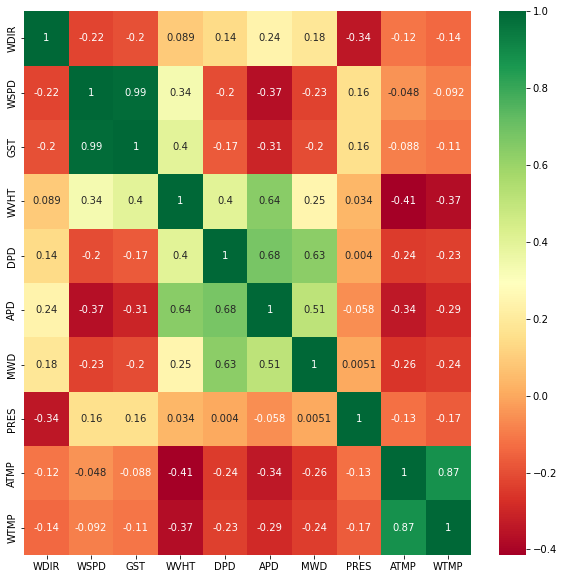

In [10]:
import seaborn as sns
#get correlations of each features in dataset
corrmat = train.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(10,10))
#plot heat map
g=sns.heatmap(train[top_corr_features].corr(),annot=True,cmap="RdYlGn")

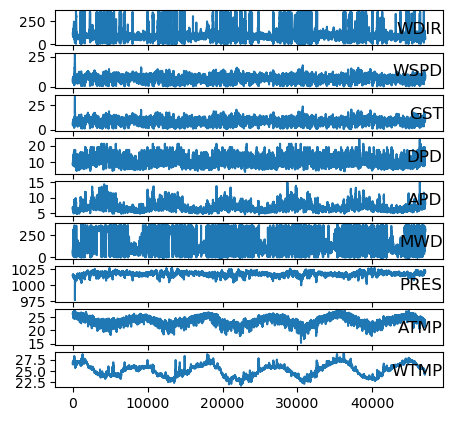

In [12]:
values = train.values
# specify columns to plot
groups = [ 1, 2, 3, 5, 6, 7, 8, 9, 10]
i = 1
# plot each column
plt.figure(figsize=(5, 5), dpi=100)
for group in groups:
	plt.subplot(len(groups), 1, i)
	plt.plot(values[:, group])
	plt.title(train.columns[group], y=0.1, loc='right')
	i += 1
plt.show()

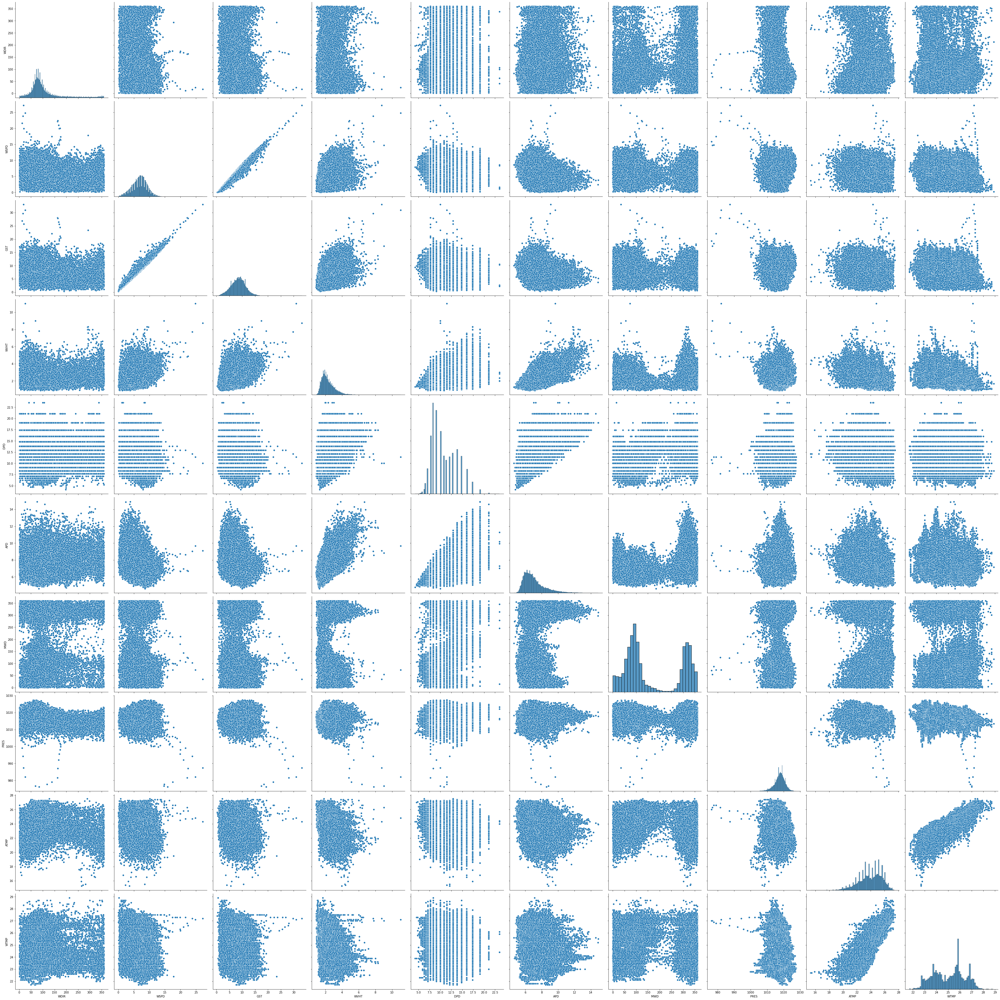

In [20]:
sns.pairplot(train, height=5)

In [21]:
train.head()

,Date,WDIR,WSPD,GST,WVHT,DPD,APD,MWD,PRES,ATMP,WTMP
0,2015-08-20 21:00:00,117,5.6,6.4,1.71,9.09,6.63,58,1015.7,26.4,26.6
1,2015-08-20 22:00:00,117,5.1,6.0,1.68,10.00,6.54,82,1015.5,26.3,26.7
2,2015-08-20 23:00:00,111,3.5,4.3,1.76,9.09,6.80,58,1015.1,26.3,26.8
3,2015-08-21 00:00:00,111,4.4,5.2,1.82,8.33,7.10,49,1014.4,26.4,27.0
4,2015-08-21 01:00:00,100,5.7,7.0,1.64,9.09,6.90,56,1014.1,26.6,26.9


In [22]:
Xtrain = train.iloc[:,[1,2,3,5,6]]
ytrain = train.iloc[:,4]

In [26]:
"""import matplotlib.pyplot as plt
for i in range(5):
    plt.hist(Xtrain[:,i], edgecolor='black')
    plt.title(features[i])
    plt.show()"""


"import matplotlib.pyplot as plt\nfor i in range(5):\n    plt.hist(Xtrain[:,i], edgecolor='black')\n    plt.title(features[i])\n    plt.show()"

In [27]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
poly=PolynomialFeatures(degree=2)
x_poly=poly.fit_transform(Xtrain)
reg=LinearRegression()
reg.fit(x_poly,ytrain)
y_pred=reg.predict(x_poly)

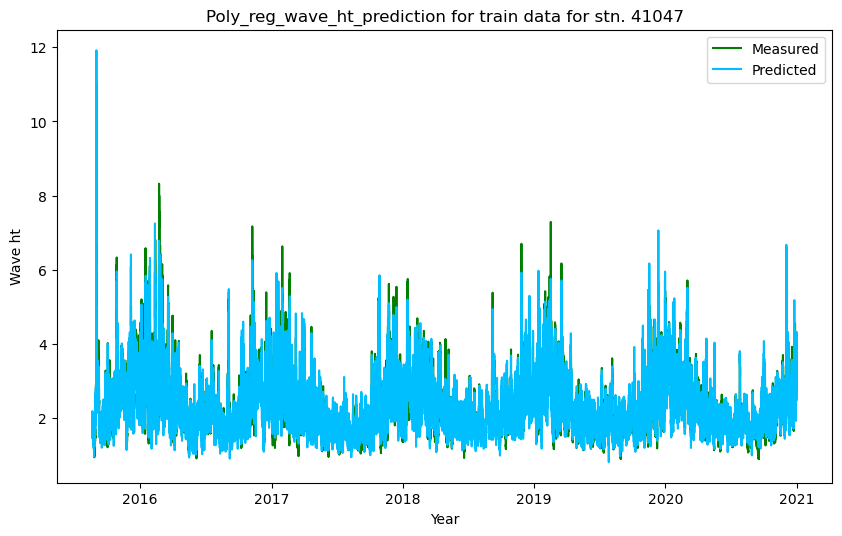

In [28]:
fig = plt.figure(figsize=(10, 6), dpi=100)
plt.plot(train['Date'], ytrain.ravel(), label='Measured', color='green')
plt.plot(train['Date'],y_pred, label='Predicted', color='deepskyblue')
#plt.plot(y_pred, color='green', label='predicted')
plt.title('Poly_reg_wave_ht_prediction for train data for stn. 41047')
plt.xlabel('Year')
plt.ylabel('Wave ht')
plt.legend(loc='upper right')

In [29]:
from sklearn.metrics import r2_score
r2_score(ytrain,y_pred)

0.831550366708943

In [30]:
import math
from sklearn.metrics import mean_squared_error
math.sqrt(mean_squared_error(ytrain,y_pred))

0.32249648399490616

In [31]:
from sklearn.metrics import mean_absolute_percentage_error
mean_absolute_percentage_error(ytrain,y_pred)

0.10207033770169752

In [32]:
from sklearn.metrics import mean_absolute_error
mean_absolute_error(ytrain,y_pred)

0.22726030615714163

In [33]:
test=pd.read_excel("51000_Testing.xlsx")

In [34]:
test

,Date,WDIR,WSPD,GST,WVHT,DPD,APD,MWD,PRES,ATMP,WTMP
0,2021-01-01 00:00:00,67,6.7,9.6,3.06,17.39,8.29,328,1019.4,21.8,24.7
1,2021-01-01 01:00:00,71,7.4,9.5,2.92,19.05,8.35,298,1019.7,23.1,24.7
2,2021-01-01 02:00:00,63,7.7,9.6,3.07,17.39,8.31,336,1020.2,23.1,24.7
3,2021-01-01 03:00:00,48,7.6,10.0,3.30,16.00,8.85,320,1021.3,23.2,24.7
4,2021-01-01 04:00:00,57,8.1,10.1,3.38,17.39,9.08,321,1022.0,22.8,24.7
...,...,...,...,...,...,...,...,...,...,...,...
8755,2021-12-31 19:00:00,99,10.3,13.8,3.02,9.09,6.56,62,1015.0,22.7,23.4
8756,2021-12-31 20:00:00,100,11.1,14.2,2.96,7.14,6.45,86,1014.9,22.8,23.4
8757,2021-12-31 21:00:00,104,11.1,13.9,2.92,10.00,6.41,46,1014.1,22.8,23.4
8758,2021-12-31 22:00:00,109,11.3,14.1,2.89,8.33,6.31,78,1013.1,22.8,23.4


In [35]:
Xtest=test.iloc[:,[1,2,3,5,6]]

In [36]:
Xtest

,WDIR,WSPD,GST,DPD,APD
0,67,6.7,9.6,17.39,8.29
1,71,7.4,9.5,19.05,8.35
2,63,7.7,9.6,17.39,8.31
3,48,7.6,10.0,16.00,8.85
4,57,8.1,10.1,17.39,9.08
...,...,...,...,...,...
8755,99,10.3,13.8,9.09,6.56
8756,100,11.1,14.2,7.14,6.45
8757,104,11.1,13.9,10.00,6.41
8758,109,11.3,14.1,8.33,6.31


In [37]:
ytest=test.iloc[:,[4]]

In [38]:
ytest

,WVHT
0,3.06
1,2.92
2,3.07
3,3.30
4,3.38
...,...
8755,3.02
8756,2.96
8757,2.92
8758,2.89


In [39]:
x_poly_test=poly.fit_transform(Xtest)
ytest_pred=reg.predict(x_poly_test)

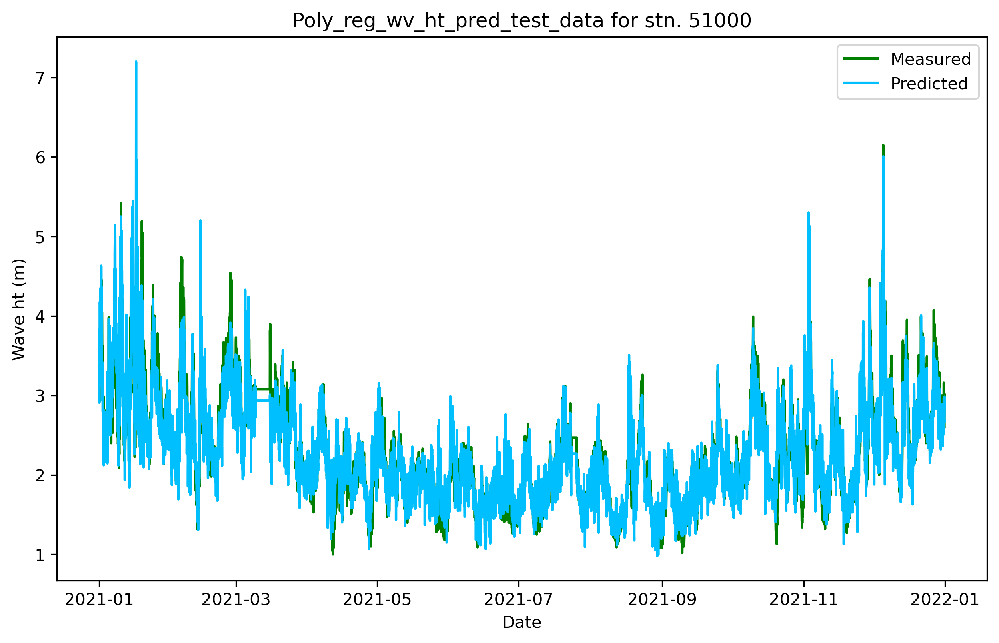

In [41]:
fig = plt.figure(figsize=(10, 6), dpi=300)
plt.plot(test['Date'], ytest, label='Measured', color='green')
plt.plot(test['Date'],ytest_pred, label='Predicted', color='deepskyblue')

#plt.plot(y_pred, color='green', label='predicted')
plt.title('Poly_reg_wv_ht_pred_test_data for stn. 51000')
plt.xlabel('Date')
plt.ylabel('Wave ht (m)')
plt.legend(loc='upper right')

In [42]:
from sklearn.metrics import r2_score
r2_score(ytest,ytest_pred)

0.8420517364672951

In [43]:
import math
from sklearn.metrics import mean_squared_error
mean_squared_error(ytest,ytest_pred)

0.07552542595210314

In [44]:
math.sqrt(mean_squared_error(ytest,ytest_pred))

0.27481889664304954

In [45]:
from sklearn.metrics import mean_absolute_percentage_error
mean_absolute_percentage_error(ytest,ytest_pred)

0.09239607313679182

In [46]:
from sklearn.metrics import mean_absolute_error
mean_absolute_error(ytest,ytest_pred)

0.20068500448333432

In [47]:
ytest_pred=pd.DataFrame(ytest_pred)

In [48]:
ytest_pred

,0
0,2.973568
1,2.910017
2,2.972537
3,3.469617
4,3.539418
...,...
8755,2.784047
8756,2.982829
8757,2.858978
8758,2.887405


In [49]:
ytest_pred.to_excel("ploy_wv_ht.xlsx")

<Figure size 3000x1800 with 0 Axes>

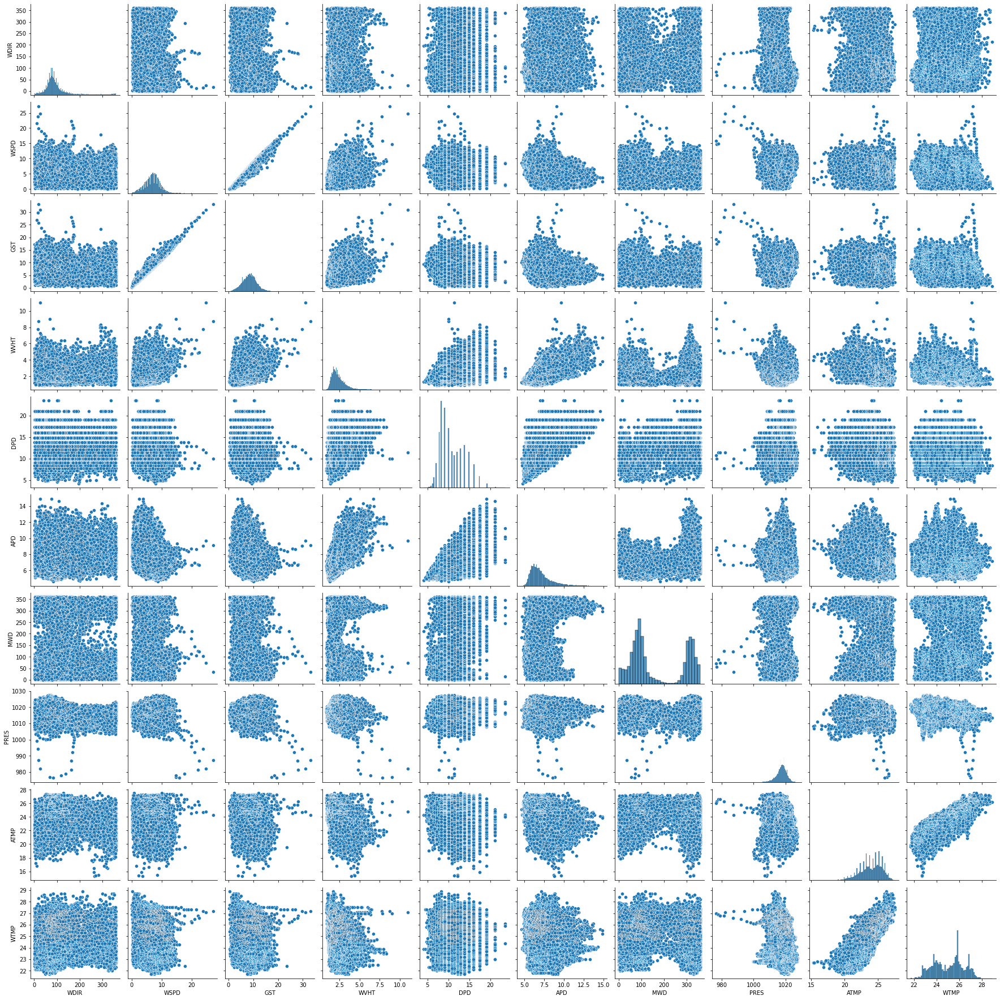

In [54]:
fig = plt.figure(figsize=(10, 6), dpi=300)
sns.pairplot(train, palette="Set1")

<AxesSubplot:xlabel='WVHT', ylabel='Density'>

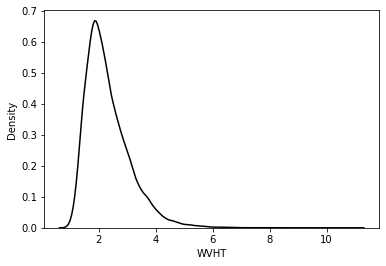

In [55]:
#density plot
sns.kdeplot(x = 'WVHT' , data = train , color = 'black')

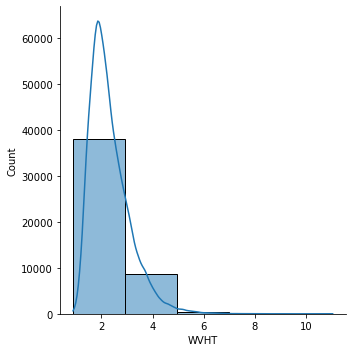

In [56]:
#distribution plot
sns.displot(x = 'WVHT',kde=True,bins = 5 , data =train)

<Figure size 720x720 with 0 Axes>

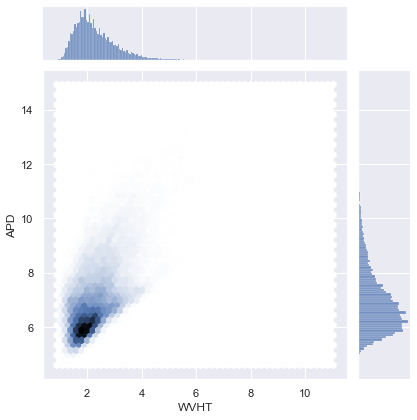

In [80]:
#joint plot
#plt.figure(figsize=(10, 10), dpi=50)

#sns.set(rc={"figure.figsize":(20, 20)}) #to set figure size and dpi

fig = plt.gcf()
fig.set_size_inches(10, 10)# not working
sns.jointplot(x='WVHT' , y ='APD',data = train , kind = 'hex') #'scatter', 'hist', 'hex', 'kde', 'reg', 'resid'



#hist plot is very good
# ax = sns.scatterplot(data=ready_couples_2[is_cluster], x='longitude', y='latitude', hue='id_easy', ax=ax)
#ax.legend_.remove()

# figure = ax.get_figure()    
#figure.savefig('test.png', dpi=500)

